# SCALE.AI Take-Home Challenge
## Submission by Adrian Lievano 

Chicago Bike Sharing:

When trying to determine the effect of a change, we often have to first account for greater sources of variation in the data, by developing a baseline model and using it to control for variables that obscure the underlying pattern.

This exercise involves a public dataset from Kaggle:  https://www.kaggle.com/yingwurenjian/chicago-divvy-bicycle-sharing-data describing rides in a bike share program in Chicago over many years.

Determine the effect of temperature on bike trip counts and lengths, controlling for any relevant seasonality (at the most relevant timescales - use your judgement!) and customer segments. Make your case with the appropriate visualizations.

If you find the amount of data overwhelming, sampling ~100k rows randomly should give you good results.

Structure your efforts into two stages - an exploration stage where you identify the important variables with significant interactions, and a synthesis stage where you pick one or two patterns to organize your findings around.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns



In [22]:
import plotly.express as px

In [2]:
df = pd.read_csv('chicago-divvy-bicycle-sharing-data/data.csv')

In [3]:
df.shape

(9495235, 23)

## Step 0: Data Preparation


## Step 1: Data Exploration

1. Define objective
2. Determine data types (feature variables)
3. Data Exploration & Visualization
4. Data Preprocessing (if needed)


Our goal is to determine the effect of temperature on:

(1) `bike trip counts.`

(2) `length, otherwise known as total duration.` 

In a typical data science problem, I would first read some background information on cycling patterns and get a better understanding of the domain from where the data comes from. In this take-home challenge, where there is limited time, I will skip this step and focus on answering the problem statement. 

Our intuition says that higher temperatures will lead to decrease trip counts and length. But, we'll see what the data tells us. 


In [4]:
df.columns

Index(['trip_id', 'year', 'month', 'week', 'day', 'hour', 'usertype', 'gender',
       'starttime', 'stoptime', 'tripduration', 'temperature', 'events',
       'from_station_id', 'from_station_name', 'latitude_start',
       'longitude_start', 'dpcapacity_start', 'to_station_id',
       'to_station_name', 'latitude_end', 'longitude_end', 'dpcapacity_end'],
      dtype='object')

In [5]:
df.shape

(9495235, 23)

In [6]:
sample_size = 100000
df_sample =df.sample(sample_size, replace = False)

In [7]:
df_sample.shape

(100000, 23)

In [8]:
df_sample.describe()

,trip_id,year,month,week,day,hour,tripduration,temperature,from_station_id,latitude_start,longitude_start,dpcapacity_start,to_station_id,latitude_end,longitude_end,dpcapacity_end
count,1.000000e+05,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,9.888374e+06,2015.743500,7.160750,29.385160,2.683530,13.607250,11.429582,63.028219,180.085900,41.900172,-87.644773,21.367270,180.680570,41.900718,-87.644997,21.299730
std,4.688941e+06,1.077552,2.705646,11.768018,1.893112,4.859001,7.193200,17.236642,121.849385,0.034688,0.021736,7.623231,122.214105,0.034959,0.021729,7.617685
min,1.109620e+06,2014.000000,1.000000,1.000000,0.000000,0.000000,2.000000,-7.100000,2.000000,41.743116,-87.802870,0.000000,2.000000,41.743116,-87.802870,0.000000
25%,5.976638e+06,2015.000000,5.000000,22.000000,1.000000,9.000000,6.000000,52.000000,77.000000,41.881032,-87.654787,15.000000,77.000000,41.881320,-87.655486,15.000000
50%,1.009989e+07,2016.000000,7.000000,30.000000,3.000000,15.000000,9.616667,66.900000,164.000000,41.892278,-87.641066,19.000000,165.000000,41.893843,-87.641088,19.000000
75%,1.387811e+07,2017.000000,9.000000,38.000000,4.000000,17.000000,15.200000,75.900000,272.000000,41.919936,-87.630585,23.000000,273.000000,41.921687,-87.630585,23.000000
max,1.753618e+07,2017.000000,12.000000,53.000000,6.000000,23.000000,60.000000,95.000000,625.000000,42.064313,-87.552812,55.000000,626.000000,42.064313,-87.549386,55.000000


In [75]:
df_sample.head(2)

,trip_id,year,month,week,day,hour,usertype,gender,starttime,stoptime,...,latitude_start,longitude_start,dpcapacity_start,to_station_id,to_station_name,latitude_end,longitude_end,dpcapacity_end,bin_temp,quantile_ex_20
4956511,9850217,2016,6,22,3,5,Subscriber,Male,2016-06-02 05:53:00,2016-06-02 06:00:00,...,41.954341,-87.686080,15.0,491,Talman Ave & Addison St,41.946636,-87.694615,15.0,6,"(55.9, 62.1]"
6417022,12333646,2016,10,41,4,8,Subscriber,Male,2016-10-14 08:17:53,2016-10-14 08:22:03,...,41.886024,-87.624117,31.0,24,Fairbanks Ct & Grand Ave,41.891860,-87.620620,15.0,5,"(37.4, 48.0]"


In [10]:
df_sample['trip_id'].nunique()

100000

In [11]:
df_sample['usertype'].unique()

array(['Subscriber', 'Customer', 'Dependent'], dtype=object)

In [12]:
df_sample.groupby('usertype')['trip_id'].count().sort_values(ascending = False)

usertype
Subscriber    99987
Customer         11
Dependent         2
Name: trip_id, dtype: int64

Note: An overwhelming majority of a sample dataset is of subscribers. This won't be a useful filter when we try to understand our temperature versus trip duration given the low representation of the other groups.

Note: This might be a good segment to filter our results on so that we understand the difference between these users. 
usertype"Customer" is a rider who purchased a 24-Hour Pass; "Subscriber" is a rider who purchased an Annual Membership

In [13]:
df_sample['gender'].unique()

array(['Male', 'Female'], dtype=object)

In [14]:
df_sample['events'].unique()

array(['cloudy', 'rain or snow', 'clear', 'tstorms', 'not clear',
       'unknown'], dtype=object)

In [15]:
df_sample.groupby('events')['trip_id'].count().sort_values(ascending = False)

events
cloudy          88514
clear            5347
rain or snow     4539
not clear         928
tstorms           668
unknown             4
Name: trip_id, dtype: int64

Note: This is another categorical variable that will serve to help us better understand how these weather conditions, in addition to temperature, influence total trip count and duration.

(1) 88% of the sample shows weather that is cloudy. 5.3% clear, 4.5% rain/snow, and around 1.6% for other or not clear.

df_sample['to_station_name'].unique()

Note: We wanted to make sure there were a unique number of trips. We run the command above to confirm this.

In [16]:
df_sample['dpcapacity_end'].describe()

count    100000.000000
mean         21.299730
std           7.617685
min           0.000000
25%          15.000000
50%          19.000000
75%          23.000000
max          55.000000
Name: dpcapacity_end, dtype: float64

We are going to place less of an emphasis on these feature variables:
    1. 'from_station_id', 
    2. 'from_station_name', 
    3. 'latitude_start',
    4. 'longitude_start', 
    5. 'dpcapacity_start', 
    6. 'to_station_id',
    7. 'to_station_name', 
    8. 'latitude_end', 
    9. 'longitude_end', 
    10. 'dpcapacity_end']

In [17]:
df_sample['temperature'].describe()

count    100000.000000
mean         63.028219
std          17.236642
min          -7.100000
25%          52.000000
50%          66.900000
75%          75.900000
max          95.000000
Name: temperature, dtype: float64

In aggregate, the average temperature across all time periods, weather conditions, users, etc., is 63 degrees Farenheit. Our hottest day was 95 degrees F. Our coldest day was -9.9 degrees F, someone was biking when it was freezing outside!

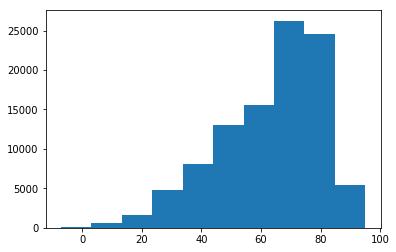

In [18]:
plt.hist(df_sample['temperature'])
plt.show()

## Step 2: Statistical Analysis of Various Aggregation Strategies

In [19]:
df_sample['tripduration'].describe()

count    100000.000000
mean         11.429582
std           7.193200
min           2.000000
25%           6.000000
50%           9.616667
75%          15.200000
max          60.000000
Name: tripduration, dtype: float64

In aggregate, the average trip time across all time periods, weather conditions, users, etc., is 11.4 minutes. Our standard deviation is 7.2 minutes, and our 3rd interquartile range of trips is at 15 minutes. If we wanted to build a prediction algorithm and we wanted to remove outliers, this would be a good upper threshold to consider.

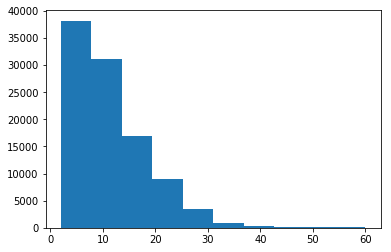

In [20]:
plt.hist(df_sample['tripduration'])
plt.show()

Note: One way to understand the data is to group results by different time variables, so that we don't produce a massive scatter plot

In [23]:
df_sample_gweek = df_sample[['year', 'month', 'week','trip_id', 'usertype', 'gender', 'events','temperature', 'tripduration']].groupby(['year','month', 'week','usertype','gender','events']).mean().reset_index()

df_sample_gweek.shape

(1485, 9)

Note: This dataframe is getting the mean temperature on a given week per year

In [24]:
df_sample_ghour = df_sample[['year', 'month', 'week','hour','trip_id', 'usertype', 'gender', 'events','temperature', 'tripduration']].groupby(['year', 'month', 'week','hour','usertype','gender','events']).mean().reset_index()
df_sample_ghour.shape


(12970, 10)

Note: This dataframe is getting the maximum temperature on a given hour per week per year

### This is an aggregate plot of temperature versus trip duration.

In [25]:
fig = px.scatter(df_sample, x='temperature', y='tripduration')
fig.show()

Note: From initial inspection, aggregate display of temperature versus trip duration tends to show an upward trend to the right. We'll further segment this data to see what we discover.

## Average Hourly Temperature vs. Trip Duration 
### Segmented by Gender

In [26]:
fig = px.scatter(df_sample_ghour, x='temperature', y='tripduration',
                color = 'gender')
fig.show()

Note: The data is still messy and hard to interpret, even after grouping by the average hourly temperature on a given week on a given year. We could fit a linear regression here to determine the slope and y-intercept of the line to match the relationship between temperature and trip duration, but it might not be as valuable given that the spread of this data is still quite high.

In [27]:
df_sample_ghour.describe()

,year,month,week,hour,trip_id,temperature,tripduration
count,12970.000000,12970.000000,12970.000000,12970.000000,1.297000e+04,12970.000000,12970.000000
mean,2015.582575,6.823207,27.992521,12.970393,9.086622e+06,54.845635,11.041600
std,1.105718,3.281057,14.285827,6.092387,4.833159e+06,18.569945,4.609688
min,2014.000000,1.000000,1.000000,0.000000,1.109620e+06,-6.000000,2.000000
25%,2015.000000,4.000000,16.000000,8.000000,4.582589e+06,41.000000,8.096711
50%,2016.000000,7.000000,29.000000,13.000000,8.809388e+06,57.900000,10.673413
75%,2017.000000,10.000000,40.000000,18.000000,1.311999e+07,70.000000,13.243456
max,2017.000000,12.000000,53.000000,23.000000,1.753613e+07,95.000000,58.383333


#### Determine if there is a strong correlation between input features for temperature and trip duration

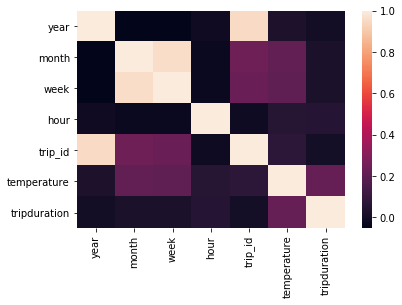

In [28]:
sns.heatmap(df_sample_ghour.corr())

After aggregating by average temperature, we see there is a 0.2 standard correlation between temperature and trip duration. We'll see how that changes depending on our aggregation technique and the different segments in our dataset (users, events, etc.)

In [29]:
df_sample_ghour[['temperature', 'tripduration']].corr()

,temperature,tripduration
temperature,1.000000,0.227671
tripduration,0.227671,1.000000


## Average Weekly Temperature vs. Trip Duration 
### Segmented by Gender

In [30]:
fig = px.scatter(df_sample_gweek, x='temperature', y='tripduration', 
                color= 'gender')
fig.show()

Note: This is the trend of temperature versus trip duration grouped by the weekly temperature rating for bike rides. It is easier to see the upward trend between an increased temperature leading to an increased trip duration.

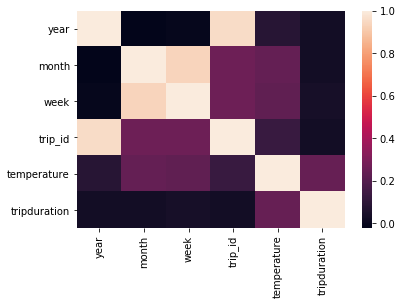

In [31]:
sns.heatmap(df_sample_gweek.corr())

In [32]:
df_sample_gweek[['temperature', 'tripduration']].corr()

,temperature,tripduration
temperature,1.000000,0.246739
tripduration,0.246739,1.000000


Note: When we compare the correlation based on an average temperature aggregation by week and by hour, there is a higher correlation between temperature and tripduration (0.251 by week and 0.238 by hour).


# Max Temperature Aggregation per Week, Hour, Year

## Weekly Aggregation

In [33]:
df_sample_gweek_max = df_sample[['year', 'week','trip_id', 'usertype', 'gender', 'events','temperature', 'tripduration']].groupby(['year','week','usertype','gender','events']).max().reset_index()

df_sample_gweek_max.shape

(1355, 8)

In [34]:
fig = px.scatter(df_sample_gweek_max, x='temperature', y='tripduration',
                color = 'gender')
fig.show()

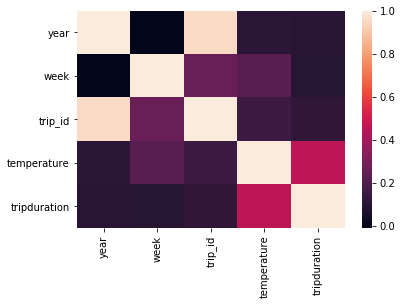

In [35]:
sns.heatmap(df_sample_gweek_max.corr())

In [36]:
df_sample_gweek_max[['temperature', 'tripduration']].corr()

,temperature,tripduration
temperature,1.000000,0.460907
tripduration,0.460907,1.000000


Note: With this new aggregation technique, we are seeing an increased correlation between temperature and tripduration based on a weekly time window to 0.470

## Hourly Aggregation 

In [37]:
df_sample_ghour_max = df_sample[['year', 'week','hour','trip_id', 'usertype', 'gender', 'events','temperature', 'tripduration']].groupby(['year','week','hour','usertype','gender','events']).max().reset_index()
df_sample_ghour_max.shape

(12000, 9)

In [38]:
fig = px.scatter(df_sample_ghour_max, x='temperature', y='tripduration', 
                color= 'gender')
fig.show()

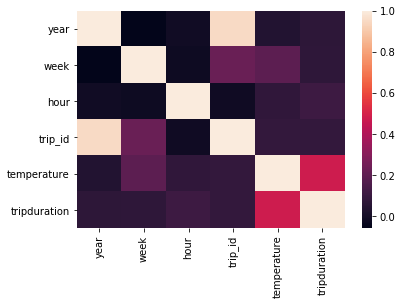

In [39]:
sns.heatmap(df_sample_ghour_max.corr())

In [40]:
df_sample_ghour_max[['temperature', 'tripduration']].corr()

,temperature,tripduration
temperature,1.000000,0.477977
tripduration,0.477977,1.000000


Note: With this new aggregation technique, we are seeing an increased correlation between temperature and tripduration based on a hourly time window at 0.4800

Note: The maximum temperature aggregation lead to an increased correlation for hourly time windows when compared to weekly time windows. This is the opposite when we applied an average-based aggregation technique.

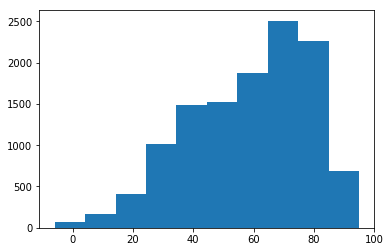

In [41]:
plt.hist(df_sample_ghour_max['temperature']);

In [42]:
df_sample_ghour_max['temperature'].describe()

count    12000.000000
mean        58.410258
std         19.611725
min         -6.000000
25%         44.100000
50%         62.100000
75%         73.900000
max         95.000000
Name: temperature, dtype: float64

#### A few key Notes to Move Forward in our Analysis

(1.) In our sample dataset, for both men and women, an average-based and maximum-value based temperature aggregation technique leads to similar results. Gender has little impact on the total time duration of the riders.

(2.) Our usertypes are predominantly subscribers. In this analysis, we will avoid filtering any results based on usertype due to the low representation of the groups other than subscribers in our sample dataset.

(3.) Most of the events categories are from cloudly days (88%). We will numerically verify the impact of different weather patterns on time_duration and determine, from their distributions, the p-value difference. If it's below a threshold of alpha, (0.05) we could say there is justification to remove it from our analysis.

### Understanding the Impact of Gender, Events, and User Type on Temperature vs. Time Duration Relationship

Goal: Statistically verify we can ignore these categories. For the purposes of this analysis, we will justify one time window or another using a two-tailed hypothesis test. 

In [43]:
fig = px.scatter(df_sample_gweek_max, x='temperature', y='tripduration')
fig.show()

In [44]:
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Histogram(x=df_sample_gweek_max['temperature'], name = 'Max Temperature Aggregation'))
fig.add_trace(go.Histogram(x=df_sample_gweek['temperature'], name = 'Average Temperature Aggregation'))

fig.update_layout(title = 'Aggregation Comparision between Mean and Max Temperature for a Weekly Time Window',
                 xaxis_title_text='Temperature (Degrees F)')


fig.show()

In [45]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=df_sample_ghour_max['temperature'], name = 'Max Temperature Aggregation'))
fig.add_trace(go.Histogram(x=df_sample_ghour['temperature'], name = 'Average Temperature Aggregation'))

# The two histograms are drawn on top of another
fig.update_layout(title = 'Aggregation Comparision between Mean and Max Temperature for a Hourly Time Window',
                 xaxis_title_text='Temperature (Degrees F)',)


fig.show()

## Significance Tests - Reject the Null or Reject the Alternative Hypothesis

Experiment:
    
    H_O (Null hypothesis): All sample mean temperature distributions from the null are equal after applying different aggregation techniques (i.e., filter on week, hour)
    H_1 (Alternative): Not all are equal. 
    
    Fail to Reject H0: All paired sample distributions are equal.
    Reject H0: One or more paired sample distributions are not equal.

#### Tests to do: we want to compare the temperature distribution mean using different grouping techniques and confirm there isn't a difference, meaning we can safely use a denoised version of temperature to approximate time duration of bike rides

"  no grouping vs. hour - avg group"

"  no grouping vs. week - avg group"

"  no grouping vs. hour - max group"

"  no grouping vs. week - max group"

"  hour - avg group vs. week - avg group"

"  hour - avg group vs. hour - max group"

"  hour - avg group vs. week - max group"

"  week - avg group vs. hour - max group"

"  week - avg group vs. week - max group"

"  hour - max group vs. week - max group"

In [46]:
#Null Case: The Original Temperature Distribution
mean_null_temp = df_sample['temperature'].mean()
std_dev_null_temp = df_sample['temperature'].std()

#Category 1: Hourly grouped temperature w/ Average Aggregation
mean_temp_hour = df_sample_ghour['temperature'].mean()
std_dev_temp_hour = df_sample_ghour['temperature'].std()

#Category 2: Weekly grouped temperature w/ Average Aggregation
mean_temp_week = df_sample_ghour['temperature'].mean()
std_dev_temp_week = df_sample_ghour['temperature'].std()

#Category 3: Hourly grouped temperature w/ Max Aggregation
mean_temp_hour_max = df_sample_ghour_max['temperature'].mean()
std_dev_temp_hour_max = df_sample_ghour_max['temperature'].std()

#Category 4: Weekly grouped temperature w/ Max Aggregation
mean_temp_week_max = df_sample_gweek_max['temperature'].mean()
std_dev_temp_week_max = df_sample_gweek_max['temperature'].std()

### Simulate from the Null Hypothesis - Build 95% Confidence Interval, alpha = 0.05
 

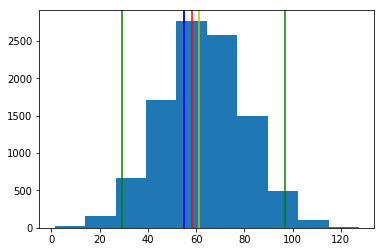

In [47]:
null_values = np.random.normal(loc=mean_null_temp, scale=std_dev_null_temp, size=10000)
plt.hist(null_values);
#
low_level = np.percentile(null_values, 2.5)
high_level = np.percentile(null_values, 97.5)

plt.axvline(mean_temp_hour_max, color='r');
plt.axvline(mean_temp_week_max, color='y');

plt.axvline(mean_temp_hour, color='b');
plt.axvline(mean_temp_week, color='b');

plt.axvline(low_level, color = 'g')
plt.axvline(high_level, color = 'g')

Note: After simulating the possible mean temperature values from the null case, and creating a 95% confidence interval of possible values for which the null hypothesis could take, we see that all the different mean temperature from the null case. Therefore, we reject the alternative. 

### Test 2: What is the difference in sample means of the temperature after applying an hourly or weekly aggregation on temperature?

    H_O (Null hypothesis): Sample mean temperature distributions between mean and max aggregations for weekly and monthly windows are equal.
    H_1 (Alternative): They are not equal. 

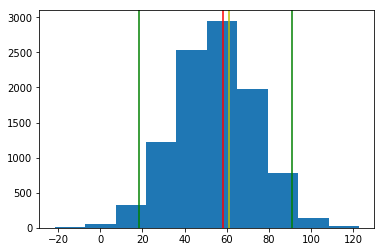

In [48]:
null_values = np.random.normal(loc=mean_temp_hour, scale=std_dev_temp_hour, size=10000)
plt.hist(null_values);
low_level = np.percentile(null_values, 2.5)
high_level = np.percentile(null_values, 97.5)

plt.axvline(mean_temp_hour_max, color='r');
plt.axvline(mean_temp_week_max, color='y');
plt.axvline(low_level, color = 'g')
plt.axvline(high_level, color = 'g')

We can reject the alternative hypothesis.

From these confidence intervals, we will use the `df_sample_ghour_max` dataframe to continue our analysis. 

## Regression Analysis

### Fitting a Line to Trip Duration to the Sampled Dataset - Hour & Weekly

In [49]:
df_sample_ghour_max.head(5)

,year,week,hour,usertype,gender,events,trip_id,temperature,tripduration
0,2014,1,5,Subscriber,Female,cloudy,4404366,26.1,12.333333
1,2014,1,6,Subscriber,Male,cloudy,4408221,25.0,25.916667
2,2014,1,7,Subscriber,Female,cloudy,4408506,9.0,16.766667
3,2014,1,7,Subscriber,Male,cloudy,4411422,9.0,6.783333
4,2014,1,7,Subscriber,Male,rain or snow,1110015,17.1,6.916667


In [50]:
from sklearn.linear_model import LinearRegression
from sklearn.cross_validation import train_test_split

# Split the 'features' and 'income' data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(pd.DataFrame(df_sample_ghour_max['temperature'][:]), 
                                                    pd.DataFrame(df_sample_ghour_max['tripduration'][:]), 
                                                    test_size = 0.2, 
                                                    random_state = 0)



/Users/adrianlievano/anaconda3/lib/python3.6/site-packages/sklearn/cross_validation.py:44: DeprecationWarning:

This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.



In [51]:
X_train.shape

(9600, 1)

In [52]:
y_train.shape

(9600, 1)

In [53]:
reg = LinearRegression().fit(X_train, y_train)
reg.score(X_train, y_train)

/Users/adrianlievano/anaconda3/lib/python3.6/site-packages/scipy/linalg/basic.py:884: RuntimeWarning:

internal gelsd driver lwork query error, required iwork dimension not returned. This is likely the result of LAPACK bug 0038, fixed in LAPACK 3.2.2 (released July 21, 2010). Falling back to 'gelss' driver.



0.22834492678539375

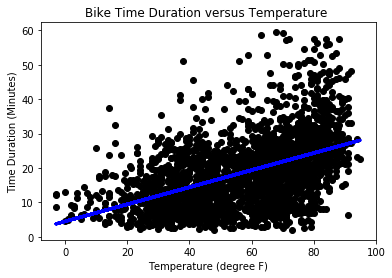

In [54]:
# Make predictions using the testing set
y_pred = reg.predict(X_test)

# Plot outputs
plt.scatter(X_test, y_test,  color='black')
plt.plot(X_test, y_pred, color='blue', linewidth=3)
plt.xlabel(s='Temperature (degree F)')
plt.ylabel(s='Time Duration (Minutes)')
plt.title(s='Bike Time Duration versus Temperature ')

In [55]:
m1 = reg.coef_[0]
b1 = reg.intercept_
print(' time_duration = {} * temp + {}'.format(m1, b1))

 time_duration = [0.24812062] * temp + [4.4926128]


## Fit a Linear Model to the Weekly Aggregated Data

In [56]:
X_train, X_test, y_train, y_test = train_test_split(pd.DataFrame(df_sample_gweek_max['temperature'][:]), 
                                                    pd.DataFrame(df_sample_gweek_max['tripduration'][:]), 
                                                    test_size = 0.2, 
                                                    random_state = 0)

reg2 = LinearRegression().fit(X_train, y_train)
reg2.score(X_train, y_train)

0.22345024907193586

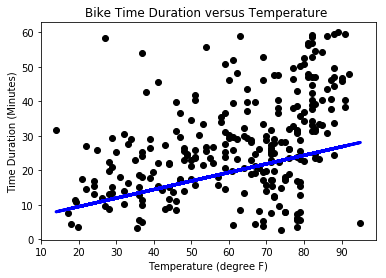

In [57]:
# Make predictions using the testing set
y_pred = reg.predict(X_test)

# Plot outputs
plt.scatter(X_test, y_test,  color='black')
plt.plot(X_test, y_pred, color='blue', linewidth=3)
plt.xlabel(s='Temperature (degree F)')
plt.ylabel(s='Time Duration (Minutes)')
plt.title(s='Bike Time Duration versus Temperature ')

In [58]:
m1 = reg2.coef_[0]
b1 = reg2.intercept_
print(' time_duration = {} * temp + {}'.format(m1, b1))

 time_duration = [0.31678307] * temp + [7.03336072]


### Polynomial Fit - 2nd and 3rd Degree Comparisons for Temperature vs. Time Duration

In [59]:
x = np.array(X_train).flatten()
y = np.array(y_train).flatten()
p = np.poly1d(np.polyfit(x, y, 8))

In [60]:
import statsmodels.formula.api as smf

df = pd.DataFrame(columns=['y', 'x'])

df['x'] = x
df['y'] = y

results = smf.ols(formula='y ~ p(x)', data=df).fit()

In [61]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.300
Model:                            OLS   Adj. R-squared:                  0.299
Method:                 Least Squares   F-statistic:                     462.8
Date:                Tue, 18 Feb 2020   Prob (F-statistic):           9.60e-86
Time:                        17:35:57   Log-Likelihood:                -4163.1
No. Observations:                1084   AIC:                             8330.
Df Residuals:                    1082   BIC:                             8340.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   2.448e-11      1.274   1.92e-11      1.000      -2.499       2.499
p(x)           1.0000      0.046     21.513      0.000       0.909       1.091
==============================================================================
Omnibus:                       13.482   Durbin-Watson:                   2.031
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               13.621
Skew:                           0.264   Prob(JB):                      0.00110
Kurtosis:                       3.152   Cond. No.                         102.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Understanding Events - Cloudly, Rainy, Etc. - Impact on Temperature


In [62]:
df_sample['events'].unique()

array(['cloudy', 'rain or snow', 'clear', 'tstorms', 'not clear',
       'unknown'], dtype=object)

In [63]:
 df_sample.groupby('events')['trip_id'].count().sort_values(ascending = False)

events
cloudy          88514
clear            5347
rain or snow     4539
not clear         928
tstorms           668
unknown             4
Name: trip_id, dtype: int64

Note: We are going to remove 'unknown' users from our initial visualizations

In [64]:
fig = px.scatter(df_sample[df_sample['events'] != 'unknown'], x='temperature', y='tripduration', 
                facet_row = 'events', color = 'usertype',
                height = 3000)
fig.show()

### Counting Number of Bike Rides Dependent on Weather Event

In [65]:
df_sample.groupby('events')

In [66]:
df_events = df_sample[['trip_id', 'usertype', 'gender', 'events','temperature', 'tripduration']].groupby('events').count().reset_index()
df_events['total_trips'] = (df_events['trip_id']/100000)*100.0

In [67]:
fig = px.bar(df_events.sort_values(by = 'total_trips', ascending = False), 
             x='events', y='total_trips', title = 'Percentage of Total Trips by Event-Type')
fig.show()

In [68]:
df_sample.groupby(['year', 'month', 'week', 'hour']).max()

trip_id  day    usertype  gender            starttime  \
year month week hour                                                           
2014 1     1    7      1110015    3  Subscriber    Male  2014-01-02 07:33:00   
                11     1109620    2  Subscriber  Female  2014-01-01 11:47:00   
                14     1109756    2  Subscriber    Male  2014-01-01 14:55:00   
                15     1109802    2  Subscriber    Male  2014-01-01 15:32:00   
           2    7      1117162    6  Subscriber    Male  2014-01-12 07:29:00   
                8      1111268    3  Subscriber    Male  2014-01-09 08:35:00   
                9      1111429    3  Subscriber    Male  2014-01-09 09:30:00   
                10     1117377    6  Subscriber    Male  2014-01-12 10:46:00   
                11     1113918    4  Subscriber    Male  2014-01-10 11:15:00   
                12     1115745    5  Subscriber    Male  2014-01-11 12:31:00   
                13     1117805    6  Subscriber    Male  2014-01-12 13:44:00   
                14     1117876    6  Subscriber    Male  2014-01-12 14:22:00   
                15     1118067    6  Subscriber    Male  2014-01-12 15:51:00   
                16     1118135    6  Subscriber    Male  2014-01-12 16:29:00   
                17     1112433    3  Subscriber    Male  2014-01-09 17:56:00   
                18     1118387    6  Subscriber    Male  2014-01-12 18:15:00   
                19     1118476    6  Subscriber    Male  2014-01-12 19:35:00   
                20     1116893    5  Subscriber    Male  2014-01-11 20:25:00   
                21     1118667    6  Subscriber    Male  2014-01-12 21:59:00   
                22     1113017    3  Subscriber    Male  2014-01-09 22:52:00   
           3    0      1125955    2  Subscriber    Male  2014-01-15 00:21:00   
                5      1131679    4  Subscriber    Male  2014-01-17 05:20:00   
                6      1128970    3  Subscriber    Male  2014-01-16 06:59:00   
                7      1134356    5  Subscriber    Male  2014-01-18 07:02:00   
                8      1135865    6  Subscriber    Male  2014-01-19 08:33:00   
                9      1132199    4  Subscriber    Male  2014-01-17 09:07:00   
                10     1129658    3  Subscriber    Male  2014-01-16 10:03:00   
                11     1126952    2  Subscriber    Male  2014-01-15 11:26:00   
                12     1132679    4  Subscriber    Male  2014-01-17 12:04:00   
                13     1136264    6  Subscriber    Male  2014-01-19 13:38:00   
...                        ...  ...         ...     ...                  ...   
2017 12    51   11    17524846    5  Subscriber    Male  2017-12-23 11:18:00   
                12    17526872    6  Subscriber    Male  2017-12-24 12:43:00   
                13    17525428    5  Subscriber    Male  2017-12-23 13:58:00   
                14    17525562    5  Subscriber    Male  2017-12-23 14:41:00   
                15    17527124    6  Subscriber    Male  2017-12-24 15:56:00   
                16    17525853    5  Subscriber    Male  2017-12-23 16:03:00   
                17    17526116    5  Subscriber    Male  2017-12-23 17:36:00   
                18    17527266    6  Subscriber    Male  2017-12-24 18:21:00   
                19    17523784    4  Subscriber    Male  2017-12-22 19:41:00   
                20    17523938    4  Subscriber    Male  2017-12-22 20:45:00   
                21    17518623    3  Subscriber    Male  2017-12-21 21:42:00   
                22    17524089    4  Subscriber    Male  2017-12-22 22:54:00   
                23    17518747    3  Subscriber    Male  2017-12-21 23:13:00   
           52   2     17527374    0  Subscriber    Male  2017-12-25 02:47:00   
                5     17529172    2  Subscriber    Male  2017-12-27 05:49:00   
                6     17533126    4  Subscriber    Male  2017-12-29 06:45:00   
                7     17535578    6  Subscriber    Male  2017-12-31 07:43:00   
                8     1

### Bin the Temperature Values so we can aggregate number of trips into each category

In [69]:
df_sample['bin_temp'] = pd.cut(df_sample['temperature'], bins=10, labels = False)
df_sample['quantile_ex_20'] = pd.qcut(df_sample['temperature'], q=10)

In [76]:
df_sample['quantile_ex_20'].head()

4956511    (55.9, 62.1]
6417022    (37.4, 48.0]
6977029    (62.1, 66.9]
2565626    (78.1, 82.0]
6948839    (66.9, 71.1]
Name: quantile_ex_20, dtype: category
Categories (10, interval[float64]): [(-7.101, 37.4] < (37.4, 48.0] < (48.0, 55.9] < (55.9, 62.1] ... (71.1, 73.9] < (73.9, 78.1] < (78.1, 82.0] < (82.0, 95.0]]

In [71]:
df_sample[['bin_temp','quantile_ex_20', 'trip_id']].groupby(['quantile_ex_20']).count().reset_index()

,quantile_ex_20,bin_temp,trip_id
0,"(-7.101, 37.4]",10031,10031
1,"(37.4, 48.0]",10902,10902
2,"(48.0, 55.9]",9879,9879
3,"(55.9, 62.1]",9209,9209
4,"(62.1, 66.9]",10676,10676
5,"(66.9, 71.1]",10638,10638
6,"(71.1, 73.9]",8707,8707
7,"(73.9, 78.1]",11373,11373
8,"(78.1, 82.0]",10018,10018
9,"(82.0, 95.0]",8567,8567


In [72]:
df_sample[['bin_temp','quantile_ex_20', 'trip_id']].groupby(['bin_temp']).count().reset_index()

,bin_temp,quantile_ex_20,trip_id
0,0,160,160
1,1,549,549
2,2,1623,1623
3,3,4817,4817
4,4,8103,8103
5,5,13019,13019
6,6,15527,15527
7,7,26247,26247
8,8,24516,24516
9,9,5439,5439


In [73]:
df_trips_per_bin = df_sample[['bin_temp','quantile_ex_20', 'trip_id','events']].groupby(['bin_temp', 'events']).count().reset_index()
df_trips_per_bin['Percent_Trips'] = (df_trips_per_bin['trip_id']/100000)*100.00

In [74]:
fig = px.bar(df_trips_per_bin, 
             x='bin_temp', y='Percent_Trips', title = 'Total Trips versus Temperature',
            labels={'Percent_Trips':' % Total Number of Trips', 'bin_temp': 'Temperature Bin (degree F)'},
            color = 'events')
fig.show()

Note: As temperature rises, the percentage of total rides increases up until a certain point of around 78 degrees F. Afterward, the total number of rides decreases.